# Lending Club Case Study

Group Members: <br>
Mitesh Patel<br>
Sravani Kallu

### Business Objectives

Lending club is the largest online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures.<br>

Borrowers can easily access lower interest rate loans through a fast online interface.<br>

The objective of analysis is to use the information about past loan applicants and find whether they ‘defaulted’ or not.


In [1]:
#Import all the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
import plotly.express as px

pd.set_option('display.max_rows', 120)

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# work with plotly
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features

## Data Understading

In [3]:
#Reading the csv file
loan = pd.read_csv("loan.csv", encoding='ISO-8859-1',low_memory = False)
loan.shape

(39717, 111)

In [4]:
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [5]:
loan.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   id                              int64  
 1   member_id                       int64  
 2   loan_amnt                       int64  
 3   funded_amnt                     int64  
 4   funded_amnt_inv                 float64
 5   term                            object 
 6   int_rate                        object 
 7   installment                     float64
 8   grade                           object 
 9   sub_grade                       object 
 10  emp_title                       object 
 11  emp_length                      object 
 12  home_ownership                  object 
 13  annual_inc                      float64
 14  verification_status             object 
 15  issue_d                         object 
 16  loan_status                     object 
 17  pymnt_plan                    

In [6]:
#First, let's check the description of the various column fields in the dataset.
df_description = pd.read_excel('Data_Dictionary.xlsx').dropna()
df_description.style.set_properties(subset=['Description'], **{'width': '1000px'})

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower is now delinquent.
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan application
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by the borrower during registration.
5,annual_inc_joint,The combined self-reported annual income provided by the co-borrowers during registration
6,application_type,Indicates whether the loan is an individual application or a joint application with two co-borrowers
7,avg_cur_bal,Average current balance of all accounts
8,bc_open_to_buy,Total open to buy on revolving bankcards.
9,bc_util,Ratio of total current balance to high credit/credit limit for all bankcard accounts.


In [7]:
loan.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


### Data Cleaning

In [8]:
# Check for duplicate rows in dataset based on id column
loan[loan.duplicated(['id'])]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit


Observation: There are no duplicate rows in loan dataset

In [9]:
# sum it up to check how many rows, columns have all missing values
print('Number of empty Rows:', loan.isnull().all(axis=1).sum())
print('Number of empty Columns:', loan.isnull().all(axis=0).sum())

Number of empty Rows: 0
Number of empty Columns: 54


In [10]:
# percentage of missing values in each column
round(loan.isnull().sum()/len(loan.index), 2)*100

id                                  0.0
member_id                           0.0
loan_amnt                           0.0
funded_amnt                         0.0
funded_amnt_inv                     0.0
term                                0.0
int_rate                            0.0
installment                         0.0
grade                               0.0
sub_grade                           0.0
emp_title                           6.0
emp_length                          3.0
home_ownership                      0.0
annual_inc                          0.0
verification_status                 0.0
issue_d                             0.0
loan_status                         0.0
pymnt_plan                          0.0
url                                 0.0
desc                               33.0
purpose                             0.0
title                               0.0
zip_code                            0.0
addr_state                          0.0
dti                                 0.0


Observation: There are many columns in the data with 100% missing values. 

Lets remove all the columns with more than 60% missing values.

In [11]:
# removing the columns having more than 60% missing values
loan.dropna(axis=1, thresh=0.6*len(loan), inplace=True)
loan.shape

(39717, 54)

In [12]:
#here we are assuming that the columns representing customer behavior are not relevant w.r.t our analysis
behaviour_columns=['delinq_2yrs','earliest_cr_line','inq_last_6mths', 'pub_rec','revol_bal','revol_util','total_acc','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries', 'collection_recovery_fee', 'last_pymnt_d','last_pymnt_amnt','last_credit_pull_d', 'application_type']                     
#removing columns assuming these are not much influencing our target variable i.e loan status. 
unnecessary_columns=['emp_title', 'title', 'zip_code', 'pymnt_plan', 'url', 'desc', 'initial_list_status', 'collections_12_mths_ex_med', 'policy_code', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt']

loan.drop(columns=behaviour_columns + unnecessary_columns, axis = 1, inplace=True)
#checking the shape again
loan.shape

(39717, 22)

In [13]:
#checking all cloumns where number of unique values is 1
loan.loc[:,loan.apply(pd.Series.nunique) == 1].columns

Index(['tax_liens'], dtype='object')

In [14]:
#Dropping tax_liens cloumn where it's number of unique values is 1
loan.drop(columns=['tax_liens'], axis = 1, inplace=True)

In [15]:
loan.isnull().sum()*100/loan.shape[0]

id                      0.000000
member_id               0.000000
loan_amnt               0.000000
funded_amnt             0.000000
funded_amnt_inv         0.000000
term                    0.000000
int_rate                0.000000
installment             0.000000
grade                   0.000000
sub_grade               0.000000
emp_length              2.706650
home_ownership          0.000000
annual_inc              0.000000
verification_status     0.000000
issue_d                 0.000000
loan_status             0.000000
purpose                 0.000000
addr_state              0.000000
dti                     0.000000
open_acc                0.000000
pub_rec_bankruptcies    1.754916
dtype: float64

In [16]:
# Remove empty rows as very few values are na.
loan = loan[~loan['emp_length'].isna()]
loan = loan[~loan['pub_rec_bankruptcies'].isna()]

In [17]:
#checking the missing values distribution again
loan.isnull().sum()*100/loan.shape[0]

id                      0.0
member_id               0.0
loan_amnt               0.0
funded_amnt             0.0
funded_amnt_inv         0.0
term                    0.0
int_rate                0.0
installment             0.0
grade                   0.0
sub_grade               0.0
emp_length              0.0
home_ownership          0.0
annual_inc              0.0
verification_status     0.0
issue_d                 0.0
loan_status             0.0
purpose                 0.0
addr_state              0.0
dti                     0.0
open_acc                0.0
pub_rec_bankruptcies    0.0
dtype: float64

Observation: All missing values are handled.

Let's analyse further

In [18]:
loan['loan_status'].value_counts()

Fully Paid     31566
Charged Off     5281
Current         1098
Name: loan_status, dtype: int64

In [19]:
# Remove records where loan status is current, as we want to anlayse only fully paied or charged off data.
loan = loan[loan['loan_status'] != 'Current']

In [20]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36847 entries, 0 to 39680
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    36847 non-null  int64  
 1   member_id             36847 non-null  int64  
 2   loan_amnt             36847 non-null  int64  
 3   funded_amnt           36847 non-null  int64  
 4   funded_amnt_inv       36847 non-null  float64
 5   term                  36847 non-null  object 
 6   int_rate              36847 non-null  object 
 7   installment           36847 non-null  float64
 8   grade                 36847 non-null  object 
 9   sub_grade             36847 non-null  object 
 10  emp_length            36847 non-null  object 
 11  home_ownership        36847 non-null  object 
 12  annual_inc            36847 non-null  float64
 13  verification_status   36847 non-null  object 
 14  issue_d               36847 non-null  object 
 15  loan_status        

In [21]:
# Checking for unique values
print("Term Unique Values: ", loan.term.unique())
print("\nGrade Unique Values: ", loan.grade.unique())
print("\nSub_Grade Unique Values: ", loan.sub_grade.unique())
print("\nEmp length unique values:",loan.emp_length.unique())
print("\nhome_ownership unique values: ",loan.home_ownership.unique())
print("\verification_status unqiue values", loan.verification_status.unique())
print("\nPurpose unique values: ", loan.purpose.unique())
print("\n\nAddr state Unique values: ", loan.addr_state.unique())

Term Unique Values:  [' 36 months' ' 60 months']

Grade Unique Values:  ['B' 'C' 'A' 'E' 'F' 'D' 'G']

Sub_Grade Unique Values:  ['B2' 'C4' 'C5' 'C1' 'A4' 'E1' 'F2' 'B5' 'C3' 'B1' 'D1' 'A1' 'B3' 'B4'
 'C2' 'D2' 'A3' 'A5' 'D5' 'A2' 'E4' 'D3' 'D4' 'F3' 'E3' 'F1' 'E5' 'G4'
 'E2' 'G2' 'G1' 'F5' 'F4' 'G5' 'G3']

Emp length unique values: ['10+ years' '< 1 year' '3 years' '8 years' '9 years' '4 years' '5 years'
 '1 year' '6 years' '2 years' '7 years']

home_ownership unique values:  ['RENT' 'OWN' 'MORTGAGE' 'OTHER']
erification_status unqiue values ['Verified' 'Source Verified' 'Not Verified']

Purpose unique values:  ['credit_card' 'car' 'small_business' 'other' 'wedding'
 'debt_consolidation' 'home_improvement' 'major_purchase' 'medical'
 'moving' 'vacation' 'house' 'renewable_energy' 'educational']


Addr state Unique values:  ['AZ' 'GA' 'IL' 'CA' 'NC' 'TX' 'VA' 'MO' 'CT' 'UT' 'FL' 'NY' 'PA' 'MN'
 'NJ' 'OR' 'KY' 'OH' 'SC' 'RI' 'LA' 'MA' 'WA' 'WI' 'AL' 'NV' 'AK' 'CO'
 'MD' 'WV' 'VT' 'MI' 

In [22]:
#Replacing emp_length string with numeric values will later convert them into discrete values as they are not having exact values
loan['emp_length']=loan['emp_length'].astype(str)
loan['emp_length']=loan['emp_length'].str.replace('< 1 year','0.5').str.replace('1 year','1').str.replace('2 years','2').str.replace('3 years','3').str.replace('4 years','4').str.replace('5 years','5').str.replace('6 years','6').str.replace('7 years','7').str.replace('8 years','8').str.replace('9 years','9').str.replace('10+ years','10')
loan.emp_length.unique()

array(['10+ years', '0.5', '3', '8', '9', '4', '5', '1', '6', '2', '7'],
      dtype=object)

In [23]:
#changing 10+years value in emp_length to 10 years and converting type of emp_length to float
loan.emp_length[loan.emp_length=='10+ years']=10
loan.emp_length= loan['emp_length'].astype(float)
loan.emp_length.unique()

array([10. ,  0.5,  3. ,  8. ,  9. ,  4. ,  5. ,  1. ,  6. ,  2. ,  7. ])

Derived Variables

Let's create new columns from date type columns

In [24]:
# extracting categorical variables month and year from categoircal variable issue_date
loan.issue_d = pd.to_datetime(loan.issue_d, format='%b-%y')

loan['issue_d_month'] = loan['issue_d'].dt.month.astype(str)
loan['issue_d_year'] = loan['issue_d'].dt.year.astype(str)
print(loan['issue_d_month'].value_counts())
print("\n",loan['issue_d_year'].value_counts())

12    4037
11    3855
10    3591
9     3374
8     3288
7     3223
6     3093
5     2836
4     2756
3     2517
1     2166
2     2111
Name: issue_d_month, dtype: int64

 2011    19801
2010    11214
2009     4713
2008     1112
2007        7
Name: issue_d_year, dtype: int64


In [25]:
loan.pub_rec_bankruptcies.value_counts()

0.0    35312
1.0     1530
2.0        5
Name: pub_rec_bankruptcies, dtype: int64

In [26]:
# checking values of int_rate as its object type but should be float
loan.int_rate.value_counts()

10.99%    891
11.49%    766
7.51%     756
13.49%    736
7.88%     701
         ... 
16.96%      1
9.83%       1
13.30%      1
17.44%      1
11.22%      1
Name: int_rate, Length: 336, dtype: int64

In [27]:
#converting column int_rate it to float
loan['int_rate'] = loan['int_rate'].str.strip('%').astype('float')

In [28]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36847 entries, 0 to 39680
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    36847 non-null  int64         
 1   member_id             36847 non-null  int64         
 2   loan_amnt             36847 non-null  int64         
 3   funded_amnt           36847 non-null  int64         
 4   funded_amnt_inv       36847 non-null  float64       
 5   term                  36847 non-null  object        
 6   int_rate              36847 non-null  float64       
 7   installment           36847 non-null  float64       
 8   grade                 36847 non-null  object        
 9   sub_grade             36847 non-null  object        
 10  emp_length            36847 non-null  float64       
 11  home_ownership        36847 non-null  object        
 12  annual_inc            36847 non-null  float64       
 13  verification_sta

In [29]:
loan.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,dti,open_acc,pub_rec_bankruptcies
count,3.684700e+04,3.684700e+04,36847.000000,36847.000000,36847.000000,36847.000000,36847.000000,36847.000000,3.684700e+04,36847.000000,36847.000000,36847.000000
mean,6.831532e+05,8.514790e+05,11141.327652,10872.924526,10430.400856,11.988346,324.694599,5.020694,6.940448e+04,13.330449,9.296578,0.041794
std,2.014598e+05,2.530373e+05,7369.988994,7109.330771,7008.919431,3.702091,208.886154,3.472258,6.402747e+04,6.651565,4.377256,0.200799
min,5.473400e+04,8.036400e+04,500.000000,500.000000,0.000000,5.420000,16.080000,0.500000,4.000000e+03,0.000000,2.000000,0.000000
25%,5.170210e+05,6.676035e+05,5500.000000,5400.000000,5000.000000,8.940000,167.565000,2.000000,4.100400e+04,8.210000,6.000000,0.000000
50%,6.596910e+05,8.432780e+05,10000.000000,9600.000000,9000.000000,11.860000,280.000000,4.000000,6.000000e+04,13.420000,9.000000,0.000000
75%,8.309685e+05,1.039330e+06,15000.000000,15000.000000,14335.044685,14.520000,428.975000,9.000000,8.300000e+04,18.590000,12.000000,0.000000
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,24.400000,1305.190000,10.000000,6.000000e+06,29.990000,44.000000,2.000000


<AxesSubplot:>

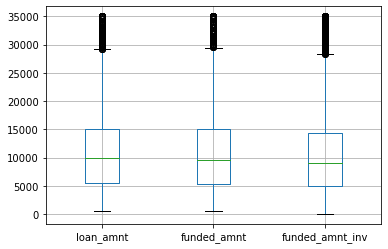

In [30]:
#boxplot for 'loan_amnt', 'funded_amnt', 'funded_amnt_inv'
loan.boxplot(column=['loan_amnt', 'funded_amnt', 'funded_amnt_inv'])

Observation: Median for loan_amnt, funded_amnt, funded_amnt_inv look's similar. will use loan_amnt for plotting.

<AxesSubplot:>

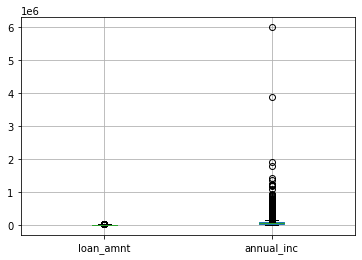

In [31]:
#box-plot for 'loan_amnt', 'annual_inc'
loan.boxplot(column=['loan_amnt', 'annual_inc'])

Observation: Few values are very high.

Removing very high values of annual_inc as its would affect the results of analysis

<AxesSubplot:>

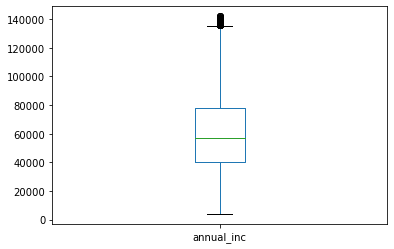

In [32]:
# Remove outliers from the annual_inc column as there are very few values greater than 30000
loan = loan[loan['annual_inc'] < loan['annual_inc'].quantile(.95)]
loan['annual_inc'].plot.box()

In [33]:
numerical = loan.select_dtypes(include=['number']).columns
print("Number of Numerical features:", len(numerical))
print("\n",numerical)

categorical = loan.select_dtypes(include=['object','datetime64']).columns
print("\n Number of categorical features:", len(categorical))
print("\n",categorical)

Number of Numerical features: 12

 Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'int_rate', 'installment', 'emp_length', 'annual_inc', 'dti',
       'open_acc', 'pub_rec_bankruptcies'],
      dtype='object')

 Number of categorical features: 11

 Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'loan_status', 'purpose', 'addr_state', 'issue_d_month',
       'issue_d_year'],
      dtype='object')


### Data Analysis

#### Univariate and Segmented Univariate Analysis

In [34]:
#Method for plotting categorical variables
#From this method we get 1) univariate analysis of independent variable 2)% of loan default and % of loan non-default 
def plotCat_Var(ind_var, figsizex=15, figsizez=5):   
    
    plt.figure(figsize=(figsizex,figsizez))
    
    plt.subplot(1, 2, 1)
    plt.xticks(rotation=40) 
    ax2 = sns.countplot(loan[ind_var],palette="hls")
    ax2.set_title(ind_var.capitalize() +" Univariate Analsyis", fontsize=10)
    ax2.set_ylabel('No.of Loans')
    
    plt.subplot(1, 2, 2)    
    plt.xticks(rotation=40) 
    g = sns.countplot(x=ind_var,data=loan, 
                  palette="hls", 
                  hue = "loan_status")
    g.set_title(ind_var.capitalize() +" Counting by loan status", fontsize=10)
    g.set_xlabel(ind_var.capitalize())
    g.set_ylabel('No.of Loans')
   
    
    df = loan.groupby([ind_var, 'loan_status'], as_index=False)['id'].count()
    df['% of default'] = df.groupby(ind_var).transform(lambda x: x/x.sum())
    plt.figure(figsize=(figsizex,10))
    plt.subplot(2, 2, 1)
    plt.xticks(rotation=40) 
    sns.barplot(x=ind_var, y='% of default', hue='loan_status', data=df, hue_order = ['Fully Paid', 'Charged Off'],palette="Paired")
    plt.title(ind_var.capitalize()+' vs Loan status')
    plt.margins(0.2, 0.2)
    plt.tight_layout()

In [35]:
#method for distribution plot for continuous variables
def plot_distribution(tar_var):
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    ax = sns.distplot(loan[tar_var])
    plt.subplot(1, 2, 2)
    sns.boxplot(y=loan[tar_var], x=loan['loan_status'], data=loan)
    plt.show()

In [36]:
# Create two data frames based on loan status to create two dataframes and plot it clearly. 
df_fullypaid = loan[loan['loan_status'] == 'Fully Paid']
df_chargedoff = loan[loan['loan_status'] == 'Charged Off']

In [37]:
#method for plotting emp_length and open_acc variables across loan_status
def plot_num(num_var):
      
    fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,12))
    plt.subplots_adjust(hspace = 0.4, top = 0.8)

    g1 = sns.distplot(df_fullypaid[num_var], ax=ax1, color="g")
    g1 = sns.distplot(df_chargedoff[num_var], ax=ax1, color='r')
    g1.set_title(num_var+" Distribuition", fontsize=15)
    g1.set_xlabel("Frequency")

    g2 = sns.countplot(x=num_var,data=loan, 
                  palette="hls", ax=ax2, 
                  hue = "loan_status")
    g2.set_title(num_var+" by loan status", fontsize=15)
    g2.set_xlabel(num_var)
    plt.show()

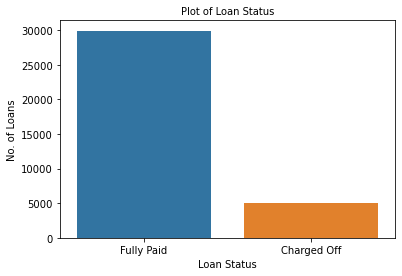

In [38]:
#count plot for target variable loan status
ax = sns.countplot(x="loan_status", data=loan)
ax.set(xlabel='Loan Status', ylabel='No. of Loans')
ax.set_title("Plot of Loan Status", fontsize=10)
plt.show()

Observation: 
    
1.More than 25000 loans are fully paid.<br>
2.Around 5000 loans are charged off.

Let's see graphs of some important variables

Let's visualise each variable univariate analysis and the average default rates and non-default across categorical variables.

###### Variable: term
    
Data_Dictionary: The number of payments on the loan. Values are in months and can be either 36 or 60.

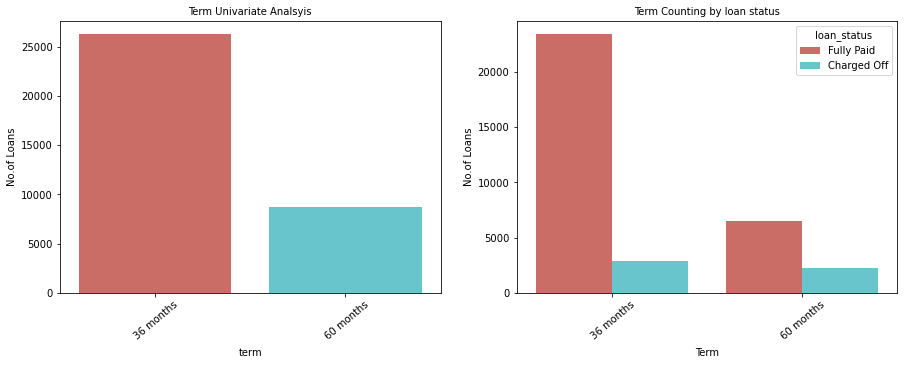

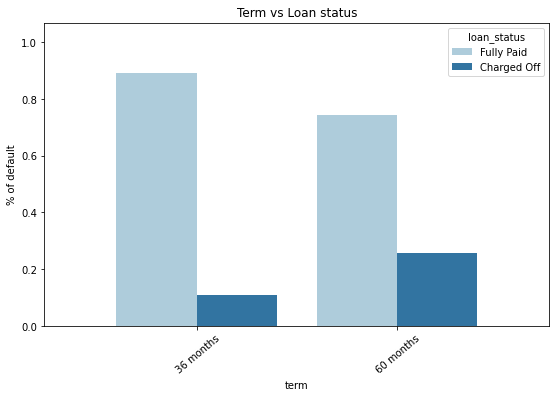

In [39]:
plotCat_Var('term')

Observation: <br>
1)There are more no.of 36months loans.<br>
2)60 months loans default rate is more than 36 months loans

###### Variable: grade

Data_Dictionary: LC assigned loan grade

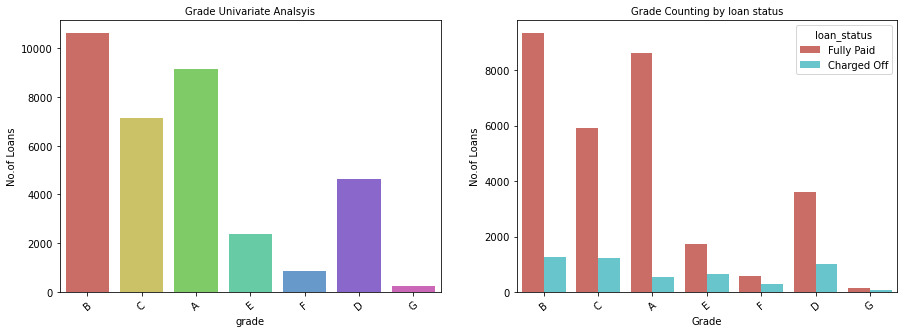

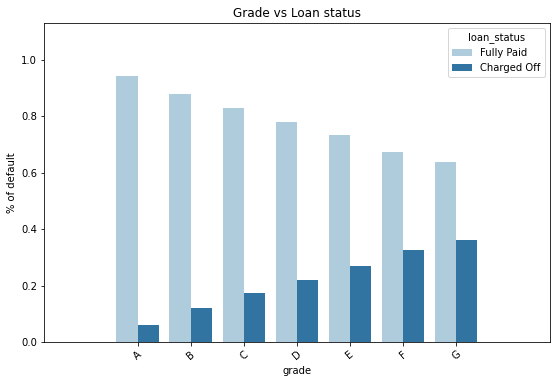

In [40]:
plotCat_Var('grade')

Observation: As the grade of loan goes from A to G, the default rate increases. This is expected because the grade is decided by Lending Club based on the riskiness of the loan.

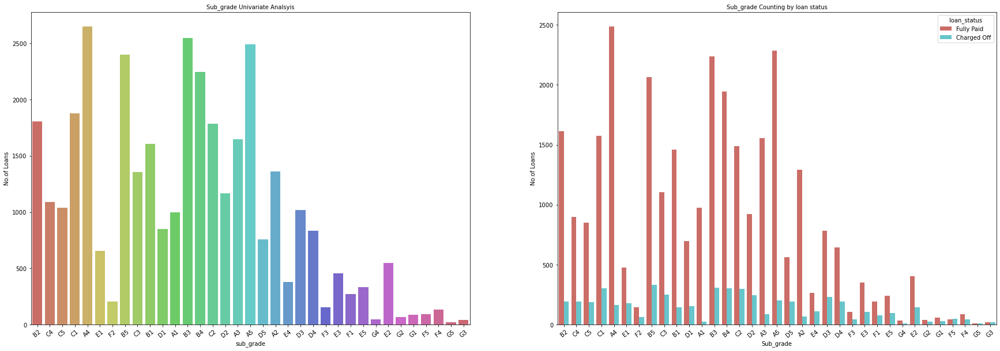

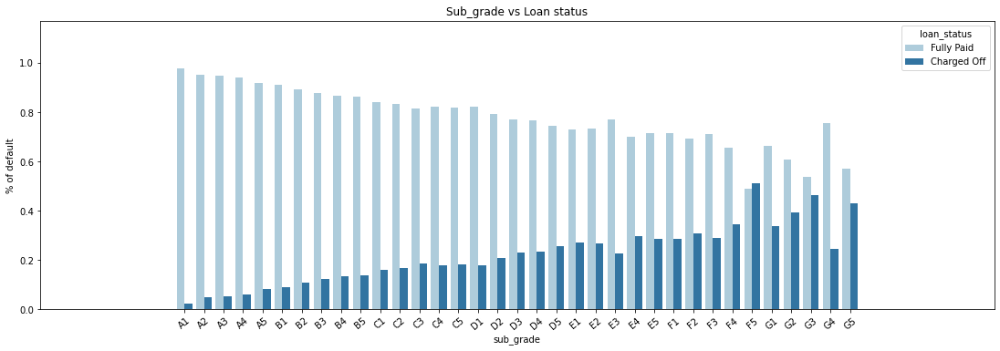

In [41]:
plotCat_Var('sub_grade', 30, 10)

Observation:
As the sub_grade of loan goes from A1 is better than A2 better than A3 and so on, the default rate increases from A1, A2, A3 and so on. This is expected because the grade is decided by Lending Club based on the riskiness of the loan.

###### Varibale: home_ownership
Data_Dictionary: home_ownership	The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.

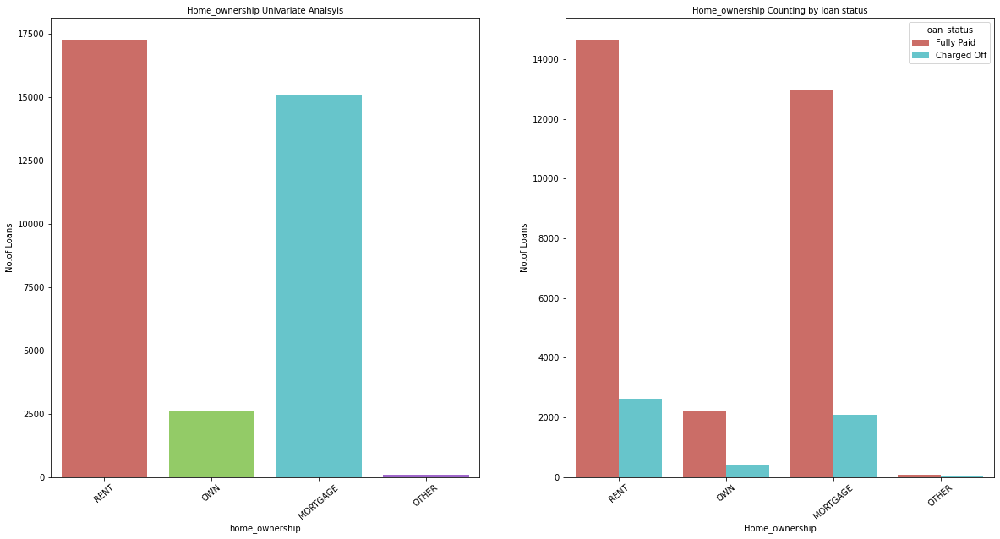

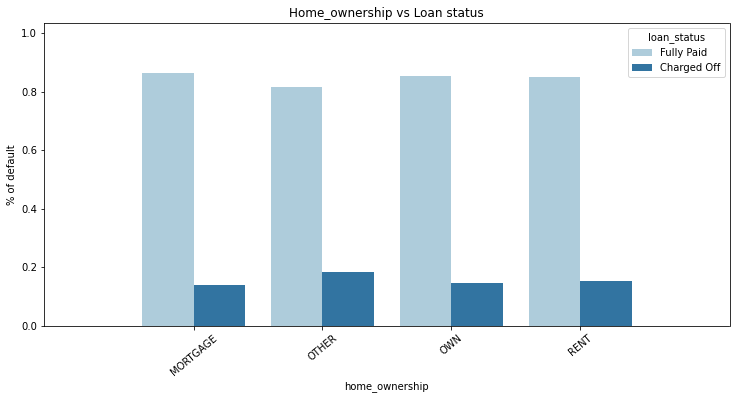

In [42]:
plotCat_Var('home_ownership', 20, 10)

Observation: <br>
1)High amountof loans are taken by Rented people. <br>
2)Percentage of Charged off loans is high for others.<br>
home_ownership is not a great discriminator.

###### Varibale: verification_status

Data_Dictionary: verification_status	Indicates if income was verified by LC, not verified, or if the income source was verified

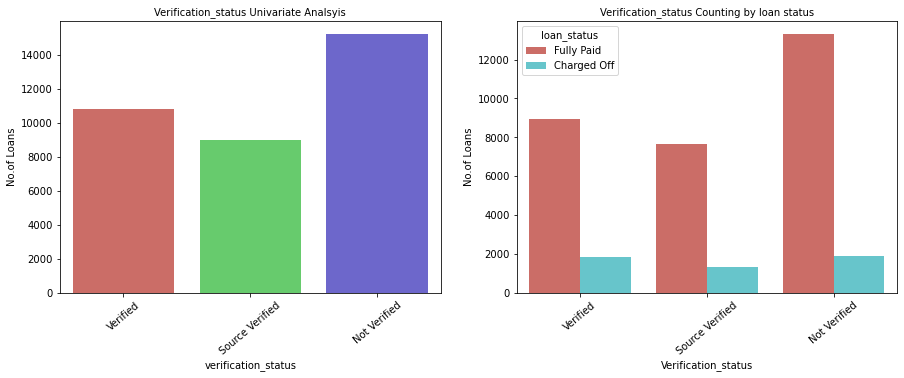

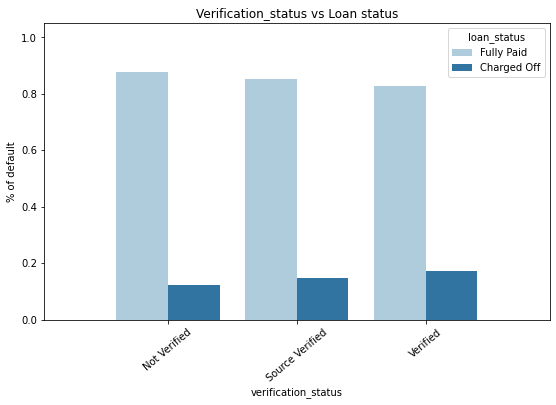

In [43]:
plotCat_Var('verification_status')

Observation: <br>
1) High amount of loans are non-verified.<br>
2)Verified loans default more than not verified which is unsual.

###### Variable: purpose
Data_Dictionary: A category provided by the borrower for the loan request.

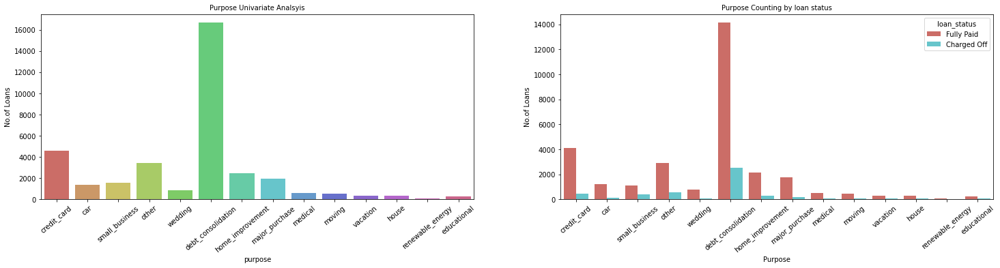

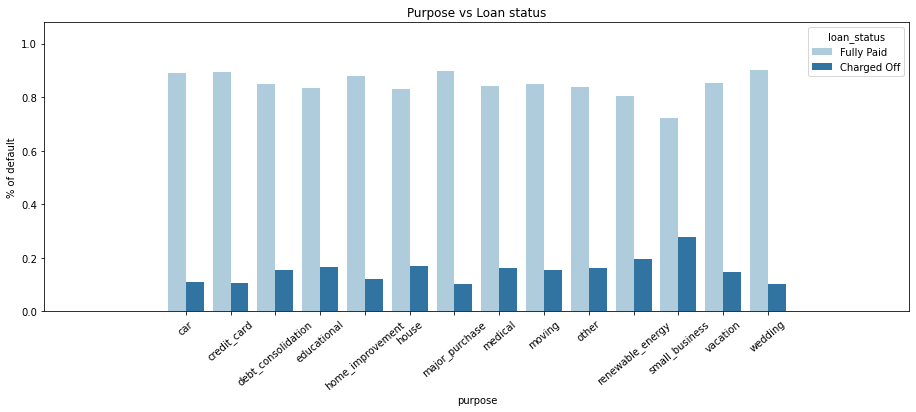

In [44]:
plotCat_Var('purpose', 25)

Observation: <br>
    
1)High amount of loans are taken for debt_consolidation.<br>
2)small business loans default the most, then renewable energy and education

###### Variable: addr_state
Data_Dictionary: The state provided by the borrower in the loan application

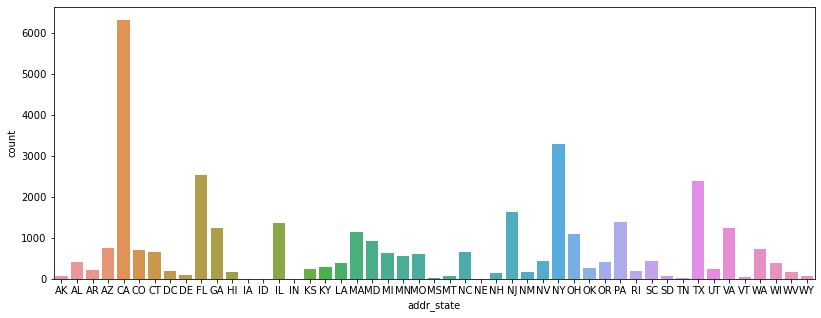

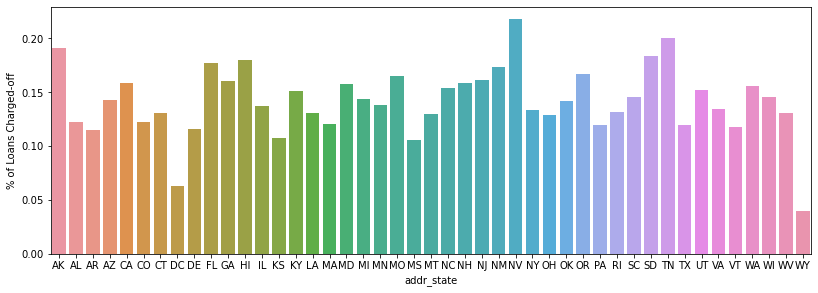

In [45]:
plt.figure(figsize=(30,5))
plt.subplot(1, 2, 1)
sns.countplot(loan['addr_state'], order=sorted(loan.addr_state.unique()))

#Fraction of loans charged off and fully Paid
charge_off_count = loan.groupby('addr_state')['loan_status'].value_counts(normalize=True).loc[:,'Charged Off']  
Fully_paid_count = loan.groupby('addr_state')['loan_status'].value_counts(normalize=True).loc[:,'Fully Paid']  

plt.figure(figsize=(30,10))
plt.subplot(2, 2, 1)
a=sns.barplot(x=charge_off_count.index, y=charge_off_count.values)
a.set_ylabel('% of Loans Charged-off')
plt.show()

Observation: <br>
1)High number of loans are issued in state with address code 'CA'.<br>
2)State with address code 'NV' is having high percentage of charged off loans.

###### Variable: issue_d_month
Derived from variable 'issue_d'<br>
Data_Dictionary: issue_d : The month which the loan was funded

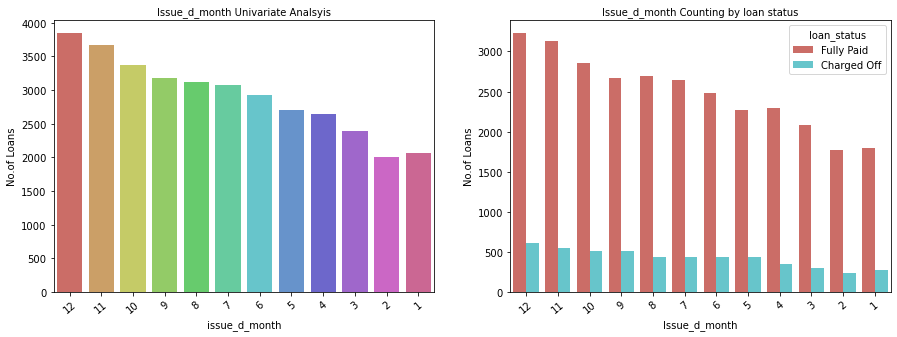

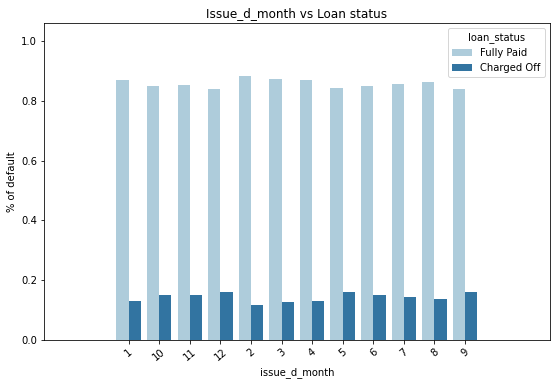

In [46]:
plotCat_Var('issue_d_month')

Observation: issue_d_month is not a great discriminator

###### Variable: issue_d_year

Derived from variable 'issue_d' <br>
Data_Dictionary: issue_d : The month which the loan was funded

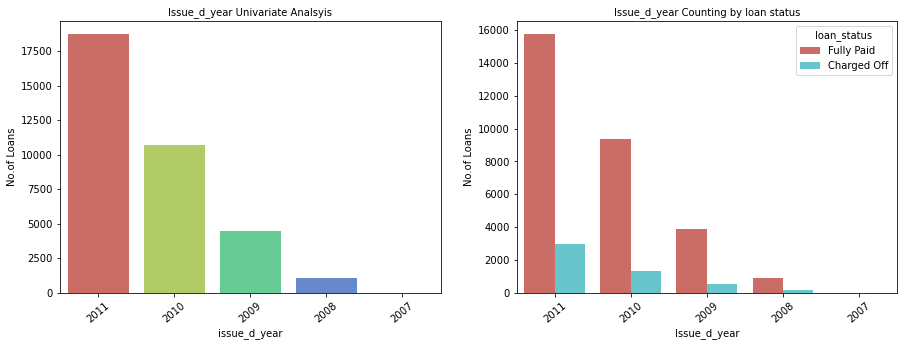

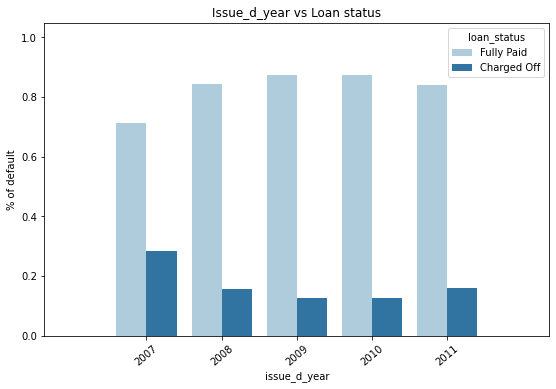

In [47]:
plotCat_Var('issue_d_year')

Observation: <br>
No.of loans taken by borrowers are gradually incresing from 2007 to 2011.<br>
The default rate was high in 2007 then decreased and suddenly increased in 2011 from 2010.

Now let's visualise each continuous variable univariate analysis and the average default rates and non-default across continuous variables.


###### Variable: loan_amnt

Data_Dictionary: The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

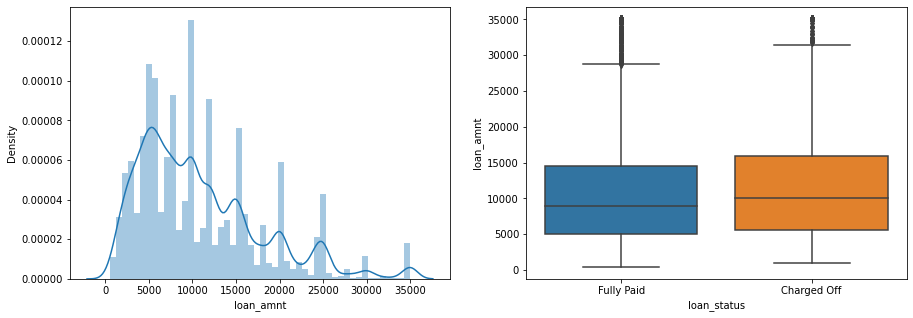

In [48]:
plot_distribution('loan_amnt')

Observation:<br>
1)Most of the loans granted are below 15000 i.e. 75 percentile value<br>
3)The median loan amount is around 10,000<br>
2)Around each 5000 boundary we can observe a spike in loan amounts.<br>

In [49]:
#Make bins for Loan Amount and create categorical variable
bins = [0, 5000, 10000, 15000, 20000, 25000,30000,40000]
slot = ['0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000','25000-30000' , '30000 and above']
loan['loan_amount_bin'] = pd.cut(loan['loan_amnt'], bins, labels=slot)
loan['loan_amount_bin'].count

<bound method Series.count of 0             0-5000
1             0-5000
2             0-5000
3         5000-10000
5             0-5000
            ...     
39562         0-5000
39573     5000-10000
39623     5000-10000
39666    15000-20000
39680         0-5000
Name: loan_amount_bin, Length: 35004, dtype: category
Categories (7, object): ['0-5000' < '5000-10000' < '10000-15000' < '15000-20000' < '20000-25000' < '25000-30000' < '30000 and above']>

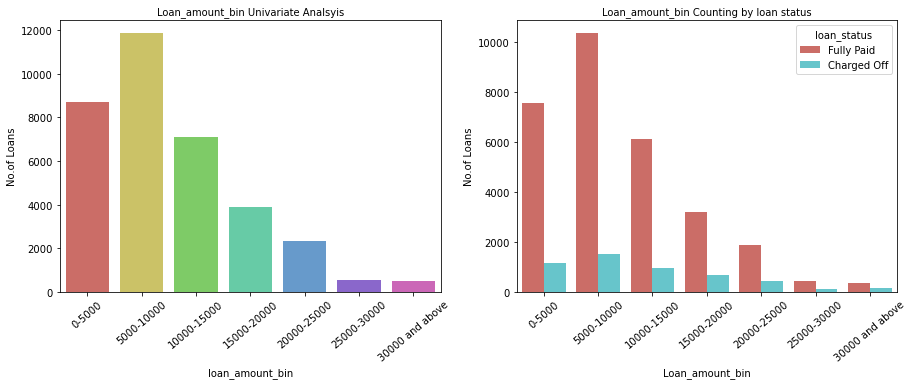

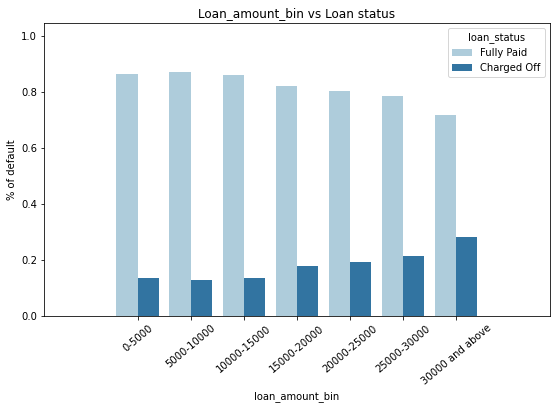

In [50]:
plotCat_Var('loan_amount_bin')

Observation: 
Percentage of Charged off loans increases as the loan amount bucket increases.<br>
Higher the loan amount, Higher the default rate.

###### Variable: int_rate

Data_Dictionary: Interest Rate on the loan

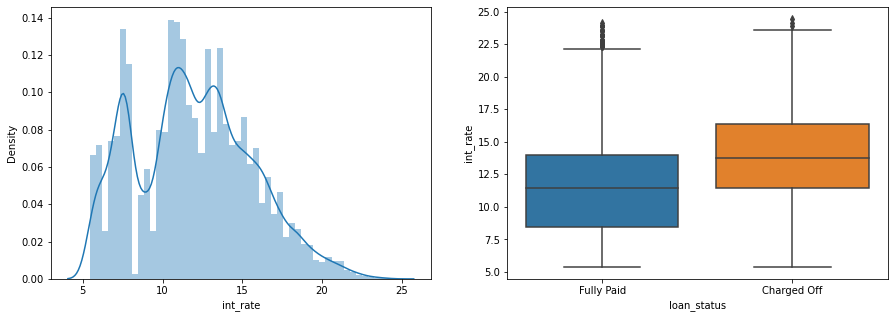

In [51]:
plot_distribution('int_rate')

Observation: Charged off borrowers count is high with high int_rate

In [52]:
#Making bins for interest range
bins = [0, 7.5, 10, 12.5, 15,20]
slot = ['0-7.5', '7.5-10', '10-12.5', '12.5-15', '15 and above']
loan['int_rate_range'] = pd.cut(loan['int_rate'], bins, labels=slot)
loan['int_rate_range'].value_counts()

10-12.5         8440
12.5-15         8201
15 and above    6611
7.5-10          6211
0-7.5           4877
Name: int_rate_range, dtype: int64

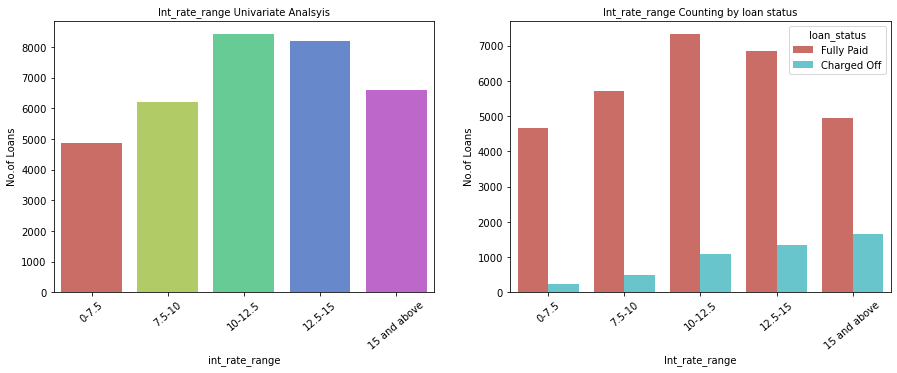

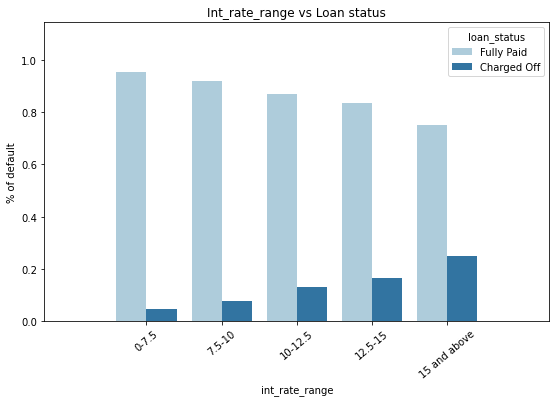

In [53]:
plotCat_Var('int_rate_range')

Observation: <br>
1)Large no.of loans are taken with int_rate of 10-12.5 by fully paid borrowers and 15 and above by charged off borrowers.<br>
2)High interest rates default more.

###### Variable: annual_inc
Data_Dictionary: The self-reported annual income provided by the borrower during registration.

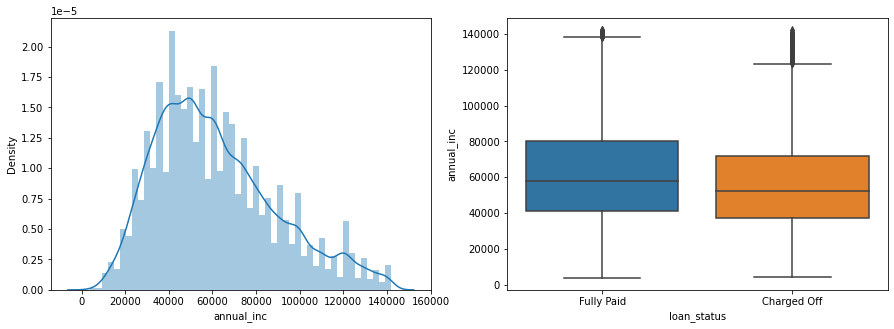

In [54]:
plot_distribution('annual_inc')

Observation: <br>
1)Most of the borrowers annual income is in between 40000 - 60000.<br>
2)Median annual income is around 60,000.<br>
3)Most people have an annual income less than 115000

In [55]:
#Make bins for Annual Income and Create Derived categorical variable
bins = [0, 20000, 40000, 60000, 80000, 100000,120000,140000, 160000]
slot = ['0-20000', '20000-40000', '40000-60000', '60000-80000', '80000-100000','100000-120000' ,'120000-140000' , '140000 and above']
loan['annual_inc_bin'] = pd.cut(loan['annual_inc'], bins, labels=slot)
loan['annual_inc_bin'].count

<bound method Series.count of 0        20000-40000
1        20000-40000
2            0-20000
3        40000-60000
5        20000-40000
            ...     
39562    20000-40000
39573    60000-80000
39623    20000-40000
39666    20000-40000
39680    20000-40000
Name: annual_inc_bin, Length: 35004, dtype: category
Categories (8, object): ['0-20000' < '20000-40000' < '40000-60000' < '60000-80000' < '80000-100000' < '100000-120000' < '120000-140000' < '140000 and above']>

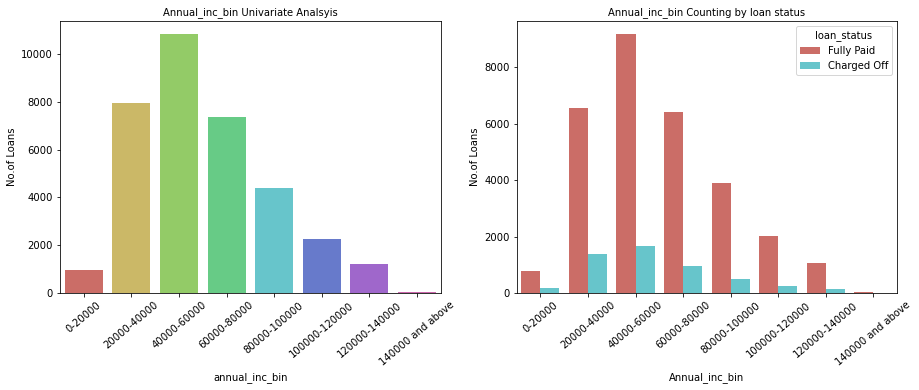

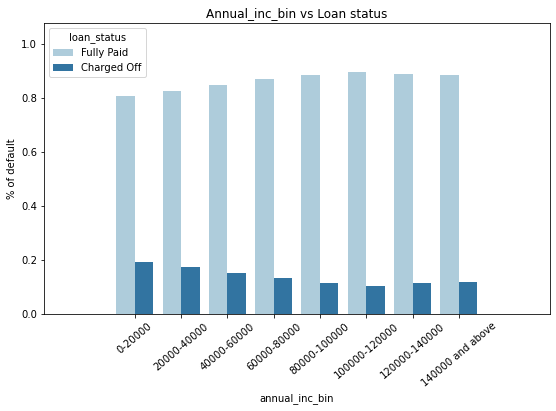

In [56]:
plotCat_Var('annual_inc_bin')

Observation: Lower the annual income, higher the default rate

###### Variable: dti

Data_Dictionary: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

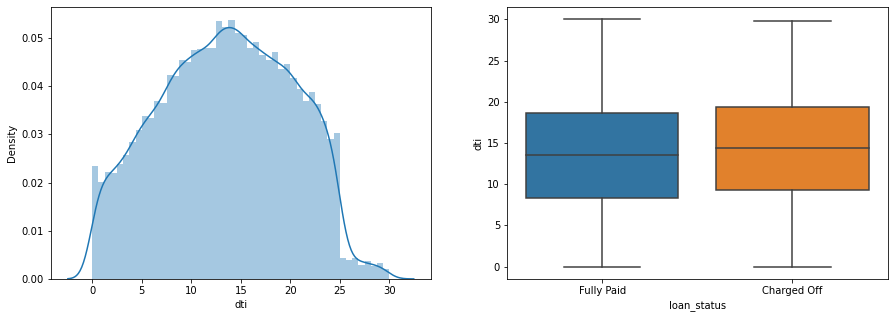

In [57]:
plot_distribution('dti')

In [58]:
#Getting Categorical data of DTI
bins = [0, 5, 10, 15, 20, 25, 30]
slot = ['0-5', '5-10', '10-15', '15-20', '20-25','25-30']
loan['dti_bin'] = pd.cut(loan['dti'], bins, labels=slot)
loan['dti_bin'].count

<bound method Series.count of 0        25-30
1          0-5
2         5-10
3        15-20
5        10-15
         ...  
39562     5-10
39573     5-10
39623     5-10
39666    10-15
39680     5-10
Name: dti_bin, Length: 35004, dtype: category
Categories (6, object): ['0-5' < '5-10' < '10-15' < '15-20' < '20-25' < '25-30']>

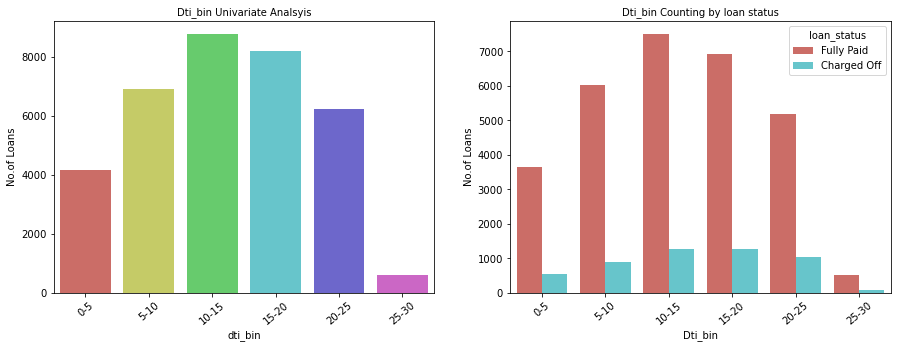

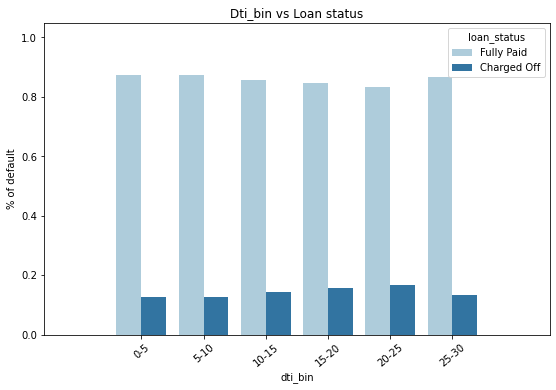

In [59]:
plotCat_Var('dti_bin')

Observation: When the dti or debt payment to income ratio is higher than 20, higher percentage of loans are Charged Off
Higher the dti higher the chances of loan being Charged Off

###### Variable: installment

Data_Dictionary: The monthly payment owed by the borrower if the loan originates

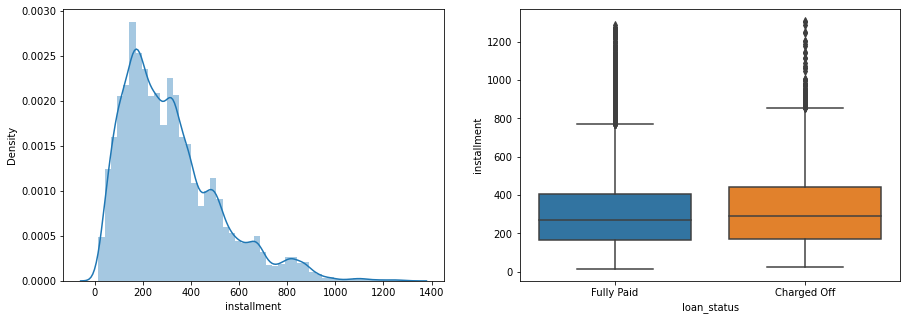

In [60]:
plot_distribution('installment')

In [61]:
#Getting Categorical data of installment
names = ['Low', 'Med', 'High']
loan['installment_bin']=pd.CategoricalIndex(pd.cut(loan.installment, 3)).rename_categories(names)
loan['installment_bin'].value_counts()

Low     27378
Med      7151
High      475
Name: installment_bin, dtype: int64

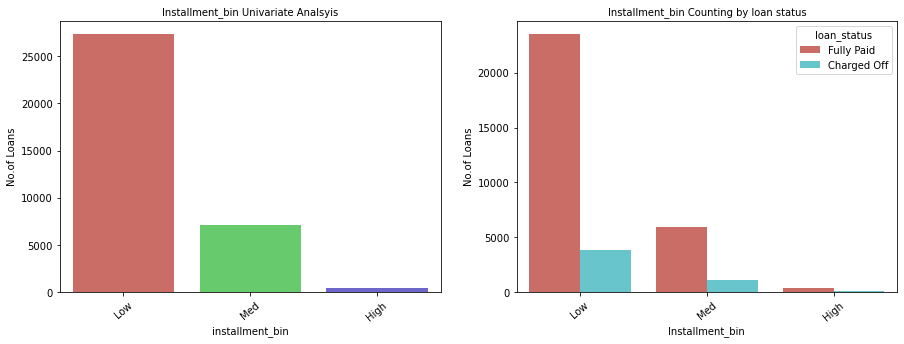

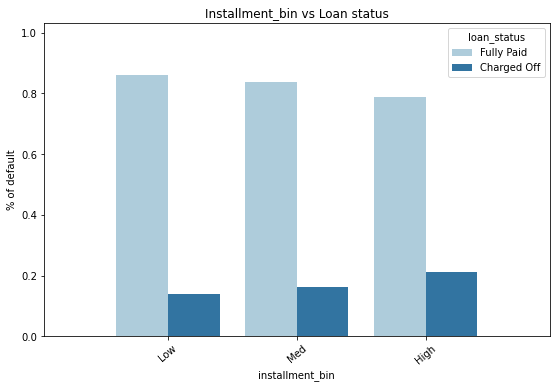

In [62]:
plotCat_Var('installment_bin')

Observation: Higher the installment amount, the higher the default rate

###### Variable: emp_length
Data_Dictionary: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

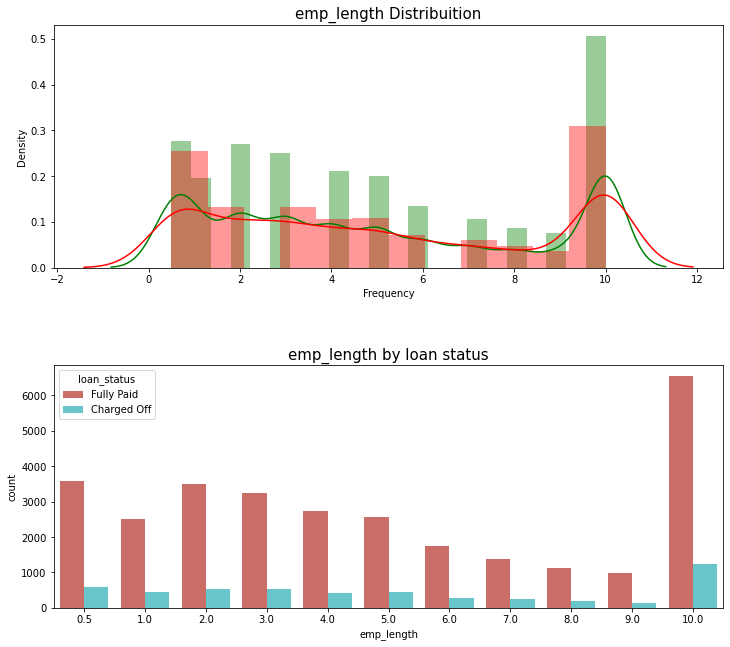

In [63]:
plot_num('emp_length')

In [64]:
#Make bins for Employee length and create discrete variable
bins = [0, 3, 6, 9, 10]
slot = ['0-3', '3-6', '6-9','9 and above']
loan['emp_length_bin'] = pd.cut(loan['emp_length'], bins, labels=slot)
loan['emp_length_bin'].count

<bound method Series.count of 0        9 and above
1                0-3
2        9 and above
3        9 and above
5                0-3
            ...     
39562            0-3
39573            0-3
39623            6-9
39666            0-3
39680            0-3
Name: emp_length_bin, Length: 35004, dtype: category
Categories (4, object): ['0-3' < '3-6' < '6-9' < '9 and above']>

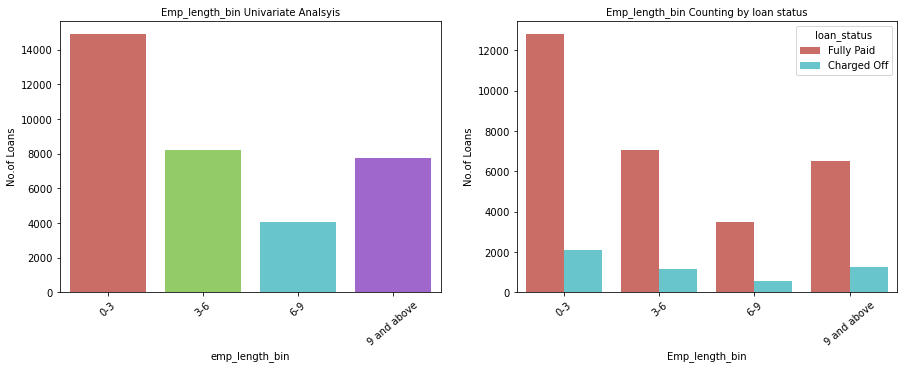

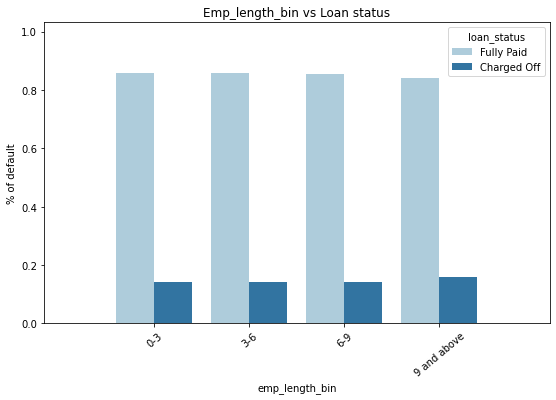

In [65]:
plotCat_Var('emp_length_bin')

Observation: Employees with less than 3 years experience has taken more no.of loans<br>
    emp_length is not much of a predictor of default

###### Variable: open_acc
Data_Dictionary: The number of open credit lines in the borrower's credit file.

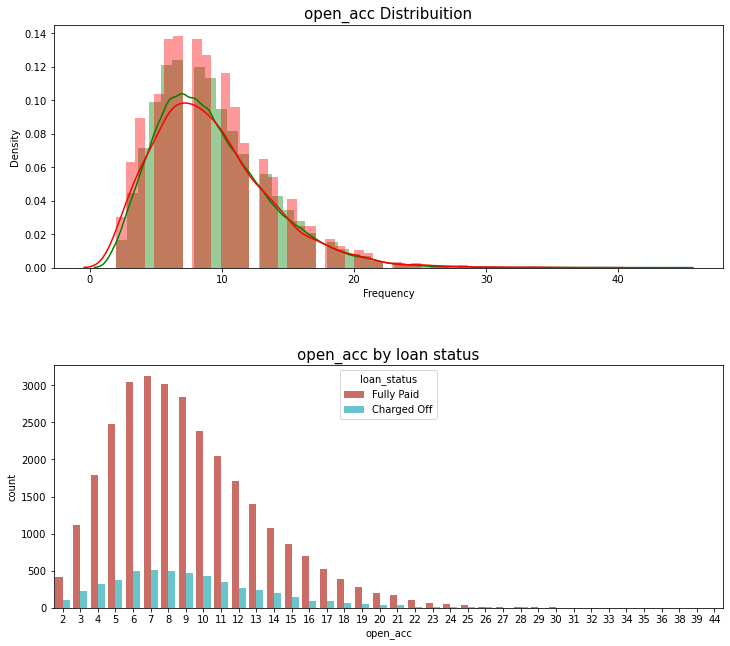

In [66]:
plot_num('open_acc')

In [67]:
#Getting Categorical data of open_acc
names = ['Less', 'Avg', 'Many']
loan['open_acc_bin']=pd.CategoricalIndex(pd.cut(loan.open_acc, 3)).rename_categories(names)
loan['open_acc_bin'].value_counts()

Less    32756
Avg      2227
Many       21
Name: open_acc_bin, dtype: int64

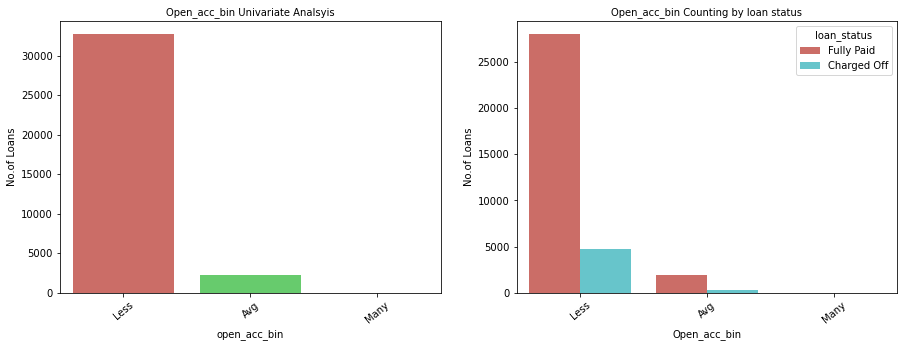

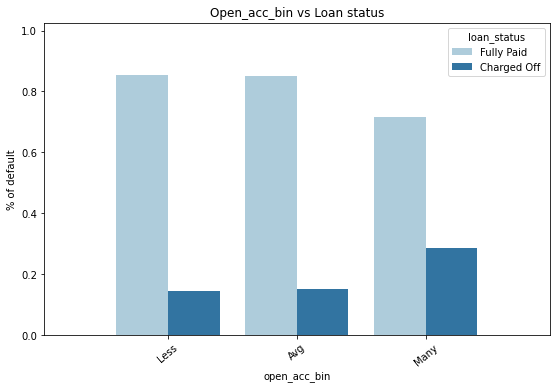

In [68]:
plotCat_Var('open_acc_bin')

Observation: <br>
    1)Most of the borrowers are having less open accounts.<br>
   2)The borrowers with many open accounts, higher the default rate

### Bivariate Analysis

In [69]:
# Create two data frames based on loan status to create two dataframes and plot it clearly. 
df_fullypaid = loan[loan['loan_status'] == 'Fully Paid']
df_chargedoff = loan[loan['loan_status'] == 'Charged Off']

In [70]:
#method for bivariate analysis plotting
def biv_plot(x_var, y_var):
    data = [
        go.Box(
            y=df_fullypaid[y_var],
            x=df_fullypaid[x_var],
            name='Fully Paid loan',
            marker=dict(
                color='#3D9970'
            )
        ),
        go.Box(
            y=df_chargedoff[y_var],
            x=df_chargedoff[x_var],
            name='Charged Off loan',
            marker=dict(
                color='#FF4136'
            )
        )
    ]

    layout = go.Layout(
        yaxis=dict(
            title=y_var.capitalize(),
            zeroline=False
        ),
        xaxis=dict(
            title=x_var+' Categorical'
        ),
        boxmode='group'
    )
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig, filename='box-'+y_var)

In [71]:
#Distribuition of Loan Amount by annual_inc_bin
biv_plot('annual_inc_bin','loan_amnt')

Observation: Borrowers with income in between 60000 to 120000 have higher no.of default rate.

In [72]:
#Distribuition of Loan Amount by dti_bin
biv_plot('dti_bin','loan_amnt')

Observation: Borrowers with dti in range of 25-30 have high default rate.

In [73]:
#Distribuition of garde by int_rate
biv_plot('grade','int_rate')

In [74]:
#Distribuition of int_rate by term and loan_amnt
biv_plot('term','int_rate')
biv_plot('term','loan_amnt')

In [75]:
#Distribuition of Loan Amount by home ownership
fig = {
    "data": [
        {
            "type": 'violin',
            "x": df_fullypaid['home_ownership'],
            "y": df_fullypaid['loan_amnt'],
            "legendgroup": 'Fully Paid Loan',
            "scalegroup": 'No',
            "name": 'Fully Paid Loan',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        },
        {
            "type": 'violin',
            "x": df_chargedoff['home_ownership'],
            "y": df_chargedoff['loan_amnt'],
            "legendgroup": 'Charged Off Loan',
            "scalegroup": 'No',
            "name": 'Charged Off Loan',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'red'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin/split', validate = False)

Observation: There are high number of defaulters who took Mortrage laons.

In [76]:
# creating a new varibale for loan_status
loan['loan_status_def'] = loan['loan_status'].apply(lambda x: 0 if x=='Fully Paid' else 1)
loan['loan_status_def'] = loan['loan_status_def'].apply(lambda x: pd.to_numeric(x))

# summarising the values
loan['loan_status_def'].value_counts()

0    29921
1     5083
Name: loan_status_def, dtype: int64

In [77]:
def plot_biv(biv_var):
    plt.figure(figsize=(20, 12))
    sns.barplot(x=biv_var,y=loan.loan_status_def,hue=loan.purpose,ci=False,palette='deep')
    plt.show()

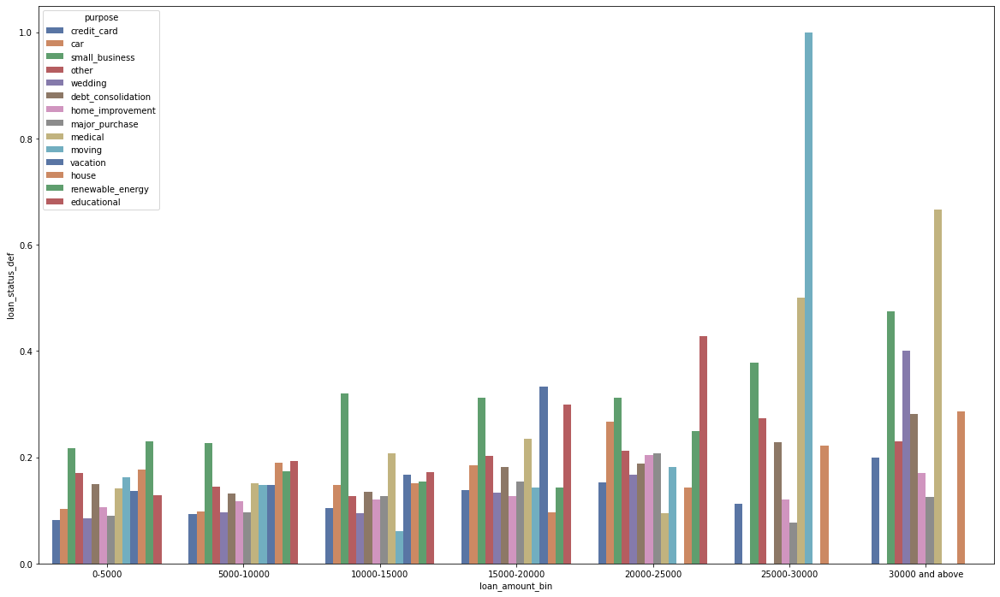

In [78]:
plot_biv(loan.loan_amount_bin)

Observation: <br>
1. For the loan amount less than 15000 and loan purpose as small business has highest chances to default.
2. For the loan amount less than 20000 and loan purpose as small business or vacation has 30% chances to default.<br>
3.For the loan amount less than 25000 and loan purpose as moving has 90% chances to default.
4. For the loan amount above 30000 and loan purpose as medical has 65% chances to default.

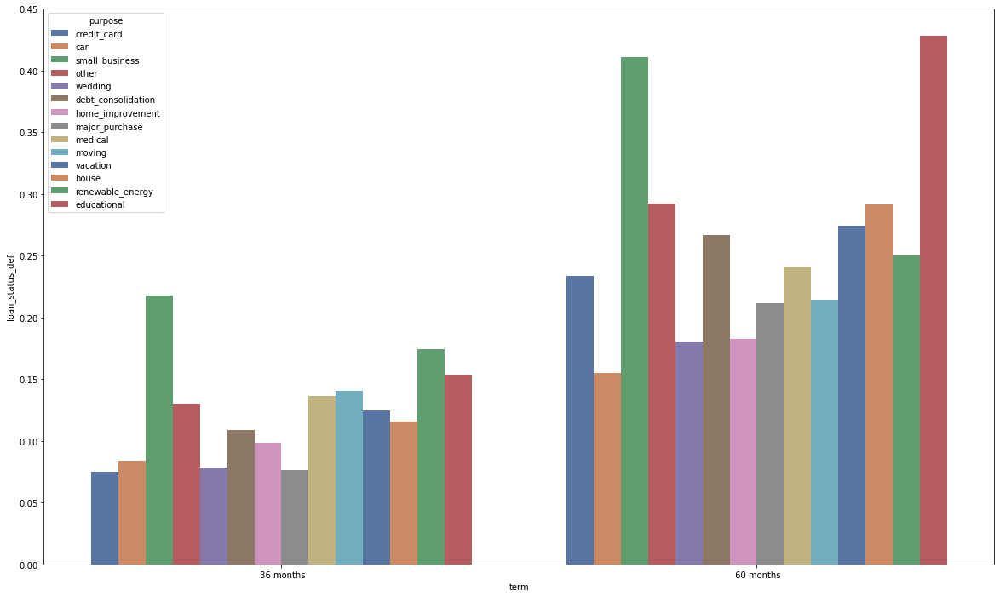

In [79]:
plot_biv(loan.term)

Observation: <br>
1. The borrowers with purpose of small business have higher chances to default irrespective of Term.<br>
2. The borrowers with purpose of credit card have around 43% chances to default in 60 months term.<br>
3. The borrowers with purpose of small business have around 22% chances to default in 36 months term.

##### Observations Comclusion: 
Lending club should reduce the high interest loans for 60 months tenure,  they are prone to loan default as 60 months loans default rate is more than 36 months loans.<br>
<br>Grades are good metric for detecting defaulters. Lending club should examine more information from borrowers before issuing loans to Low grade (G to A).<br>
<br>The borrowers with many open accounts, higher the default rate. LC should open accounts of borrowers before issuing loans borrowers with many open accounts.<br>
<br>Small business loans are defaulted more. Lending club should stop/reduce issuing the loans to them.
<br>Higher the dti higher the chances of loan being Charged Off. LC should examine borrowers with high DTI before issuing loans.<br>
<br>Higher the loan amount/Int_rate, Higher the default rate.
